- A ZIP file stored on your drive
- Automatic extraction
- Processing all subjects (S001–S109)
- Resampling to 128 Hz
- Concatenating runs
- Saving {subject}_combined_raw.fif

In [2]:
!pip install mne --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.5/7.5 MB 53.7 MB/s eta 0:00:00


In [4]:
import os
import zipfile
import warnings
from glob import glob
from pathlib import Path
import mne

# ===============================
# CONFIG
# ===============================
zip_path = '/content/drive/MyDrive/EEG_dataset/physionet_mi_full.zip'       # your ZIP file
extract_dir = '/content/local_data'       # where we will extract the ZIP

COMMON_SFREQ = 128.0
TOTAL_SUBJECTS = 109

# ===============================
# STEP 1 — Extract ZIP if needed
# ===============================
extract_dir = Path(extract_dir)
if not extract_dir.exists():
    print("Extracting ZIP file... this may take a few minutes.")
    extract_dir.mkdir(parents=True, exist_ok=True)
    with zipfile.ZipFile(zip_path, 'r') as z:
        z.extractall(extract_dir)
    print("Extraction complete.")
else:
    print("ZIP already extracted. Skipping extraction.")

# ===============================
# STEP 2 — Process each subject
# ===============================
base_data_path = Path('/content/local_data/MNE-eegbci-data/files/eegmmidb/1.0.0') # after extraction, this becomes the data root

for i in range(1, TOTAL_SUBJECTS + 1):

    subject_name = f'S{i:03d}'
    subject_folder = base_data_path / subject_name

    if not subject_folder.exists():
        print(f"[WARNING] {subject_name} folder not found — skipping.")
        continue

    # Find all runs for this subject
    run_files = sorted(glob(str(subject_folder / f"{subject_name}R*.edf")))

    print(f"\n=== Subject {subject_name} ===")
    print(f"Found {len(run_files)} EDF files.")

    if len(run_files) == 0:
        continue

    raws_list = []

    # ===============================
    # Load + choose the eeg channels only + Resample
    # ===============================
    for file_path in run_files:
        print(f" Loading: {os.path.basename(file_path)}")

        raw = mne.io.read_raw_edf(file_path, preload=True, verbose=False)
        # choose the eeg channels only
        picks = mne.pick_types(raw.info, eeg=True, eog=False, stim=False, exclude='bads')
        raw.pick(picks)
        # Resample if needed
        if raw.info['sfreq'] != COMMON_SFREQ:
            print(f"  Resampling {raw.info['sfreq']} → {COMMON_SFREQ} Hz")
            with warnings.catch_warnings():
                warnings.simplefilter("ignore")
                raw.resample(COMMON_SFREQ)

        raws_list.append(raw)

    # ===============================
    # Concatenate runs
    # ===============================
    print(f" Concatenating {len(raws_list)} runs...")
    combined_raw = mne.concatenate_raws(raws_list, verbose=False)

    # ===============================
    # Save output
    # ===============================
    output_filename = subject_folder / f"{subject_name}_combined_raw.fif"
    combined_raw.save(output_filename, overwrite=True)
    print(f" Saved → {output_filename}")

print("\nAll subjects processed successfully.")


Extracting ZIP file... this may take a few minutes.
Extraction complete.

=== Subject S001 ===
Found 6 EDF files.
 Loading: S001R07.edf
  Resampling 160.0 → 128.0 Hz
 Loading: S001R08.edf
  Resampling 160.0 → 128.0 Hz
 Loading: S001R09.edf
  Resampling 160.0 → 128.0 Hz
 Loading: S001R10.edf
  Resampling 160.0 → 128.0 Hz
 Loading: S001R13.edf
  Resampling 160.0 → 128.0 Hz
 Loading: S001R14.edf
  Resampling 160.0 → 128.0 Hz
 Concatenating 6 runs...
Writing /content/local_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S001/S001_combined_raw.fif
Closing /content/local_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S001/S001_combined_raw.fif
[done]
 Saved → /content/local_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S001/S001_combined_raw.fif

=== Subject S002 ===
Found 6 EDF files.
 Loading: S002R07.edf
  Resampling 160.0 → 128.0 Hz
 Loading: S002R08.edf
  Resampling 160.0 → 128.0 Hz
 Loading: S002R09.edf
  Resampling 160.0 → 128.0 Hz
 Loading: S002R10.edf
  Resampling 160.0 → 128.0 Hz
 Loading: S002R1

/tmp/ipython-input-860783906.py:61: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_edf(file_path, preload=True, verbose=False)
/tmp/ipython-input-860783906.py:61: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_edf(file_path, preload=True, verbose=False)
/tmp/ipython-input-860783906.py:61: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_edf(file_path, preload=True, verbose=False)
/tmp/ipython-input-860783906.py:61: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_edf(file_path, preload=True, verbose=False)
/tmp/ipython-input-860783906.py:61: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_edf(file_path, preload=True, verbose=False)


 Loading: S100R14.edf
 Concatenating 6 runs...
Writing /content/local_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S100/S100_combined_raw.fif


/tmp/ipython-input-860783906.py:61: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_edf(file_path, preload=True, verbose=False)


Closing /content/local_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S100/S100_combined_raw.fif
[done]
 Saved → /content/local_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S100/S100_combined_raw.fif

=== Subject S101 ===
Found 6 EDF files.
 Loading: S101R07.edf
  Resampling 160.0 → 128.0 Hz
 Loading: S101R08.edf
  Resampling 160.0 → 128.0 Hz
 Loading: S101R09.edf
  Resampling 160.0 → 128.0 Hz
 Loading: S101R10.edf
  Resampling 160.0 → 128.0 Hz
 Loading: S101R13.edf
  Resampling 160.0 → 128.0 Hz
 Loading: S101R14.edf
  Resampling 160.0 → 128.0 Hz
 Concatenating 6 runs...
Writing /content/local_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S101/S101_combined_raw.fif
Closing /content/local_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S101/S101_combined_raw.fif
[done]
 Saved → /content/local_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S101/S101_combined_raw.fif

=== Subject S102 ===
Found 6 EDF files.
 Loading: S102R07.edf
  Resampling 160.0 → 128.0 Hz
 Loading: S102R08.edf
  Resampling 160.0 → 128.0 Hz
 

In [3]:
combined_raw

<RawEDF | S109R07.edf, 64 x 94464 (738.0 s), ~46.2 MiB, data loaded>

In [4]:
print(combined_raw.ch_names)

['Fc5.', 'Fc3.', 'Fc1.', 'Fcz.', 'Fc2.', 'Fc4.', 'Fc6.', 'C5..', 'C3..', 'C1..', 'Cz..', 'C2..', 'C4..', 'C6..', 'Cp5.', 'Cp3.', 'Cp1.', 'Cpz.', 'Cp2.', 'Cp4.', 'Cp6.', 'Fp1.', 'Fpz.', 'Fp2.', 'Af7.', 'Af3.', 'Afz.', 'Af4.', 'Af8.', 'F7..', 'F5..', 'F3..', 'F1..', 'Fz..', 'F2..', 'F4..', 'F6..', 'F8..', 'Ft7.', 'Ft8.', 'T7..', 'T8..', 'T9..', 'T10.', 'Tp7.', 'Tp8.', 'P7..', 'P5..', 'P3..', 'P1..', 'Pz..', 'P2..', 'P4..', 'P6..', 'P8..', 'Po7.', 'Po3.', 'Poz.', 'Po4.', 'Po8.', 'O1..', 'Oz..', 'O2..', 'Iz..']


Using matplotlib as 2D backend.


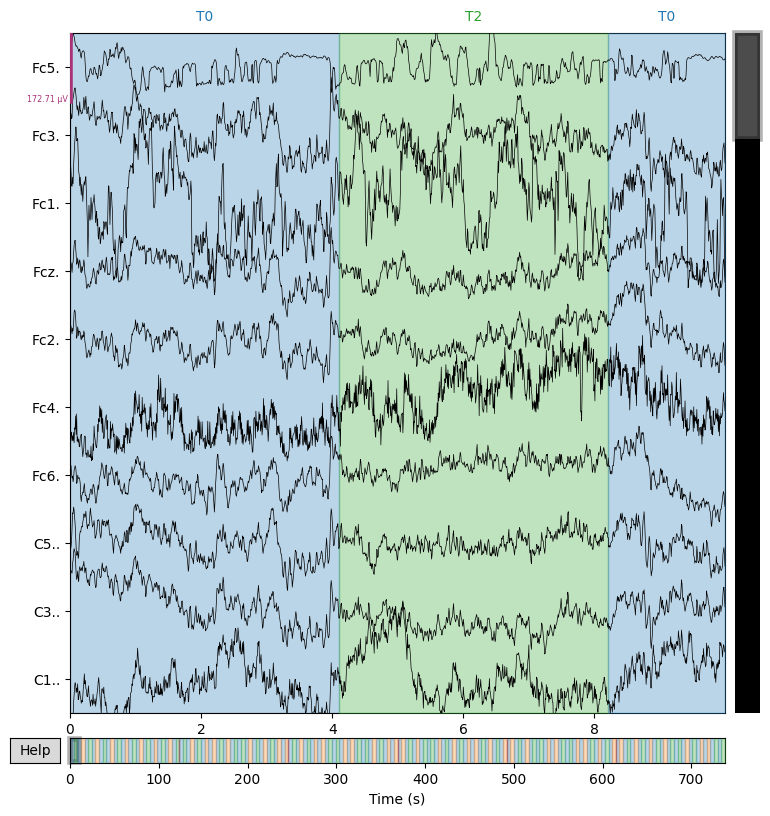

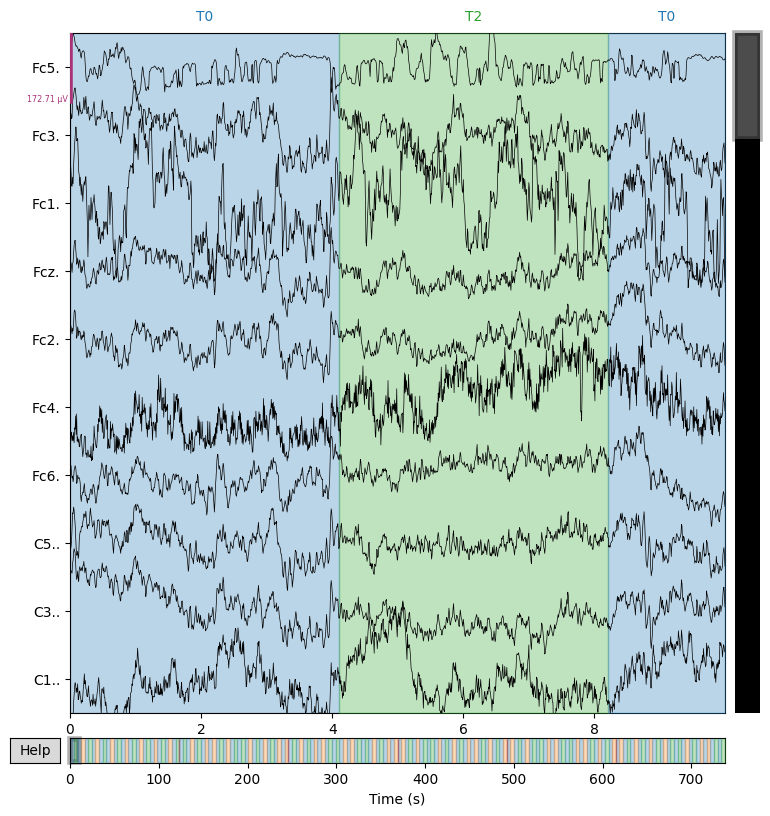

In [5]:
combined_raw.plot(n_channels=10, duration=10, scalings='auto')

In [6]:
print(combined_raw.info['sfreq'])  # should be 128.0 Hz

128.0


In [7]:
print(combined_raw.annotations)  # shows original run boundaries if you kept them

<Annotations | 190 segments: BAD boundary (5), EDGE boundary (5), T0 (90), ...>


NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 16.000 (s)
Plotting power spectral density (dB=True).


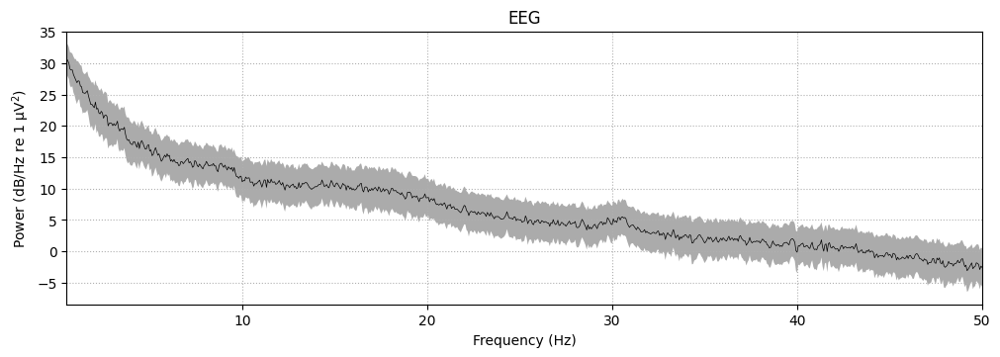

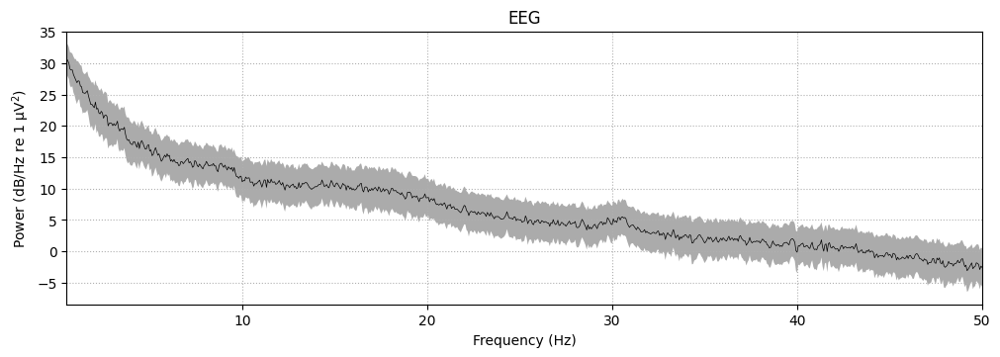

In [8]:
combined_raw.plot_psd(fmin=0.5, fmax=50, average=True)

In [9]:
import numpy as np

data = combined_raw.get_data()  # shape (n_channels, n_times)
print("Data shape:", data.shape)

for i, ch in enumerate(combined_raw.ch_names):
    print(f"{ch}: min={np.min(data[i]):.2e}, max={np.max(data[i]):.2e}, mean={np.mean(data[i]):.2e}, std={np.std(data[i]):.2e}")


Data shape: (64, 94464)
Fc5.: min=-1.52e-04, max=2.23e-04, mean=9.48e-06, std=3.42e-05
Fc3.: min=-2.88e-04, max=3.09e-04, mean=-1.58e-05, std=8.64e-05
Fc1.: min=-3.19e-04, max=3.46e-04, mean=-1.57e-05, std=1.30e-04
Fcz.: min=-2.63e-04, max=2.71e-04, mean=-6.47e-06, std=6.38e-05
Fc2.: min=-2.68e-04, max=2.76e-04, mean=-8.04e-06, std=6.73e-05
Fc4.: min=-3.53e-04, max=3.45e-04, mean=-3.31e-05, std=1.11e-04
Fc6.: min=-2.79e-04, max=2.59e-04, mean=-1.01e-05, std=6.78e-05
C5..: min=-2.82e-04, max=2.60e-04, mean=-1.24e-05, std=6.55e-05
C3..: min=-2.79e-04, max=2.82e-04, mean=-9.99e-06, std=7.16e-05
C1..: min=-3.43e-04, max=3.02e-04, mean=-2.00e-05, std=1.00e-04
Cz..: min=-2.73e-04, max=2.76e-04, mean=-6.60e-06, std=7.02e-05
C2..: min=-2.72e-04, max=2.42e-04, mean=-7.21e-06, std=5.96e-05
C4..: min=-3.49e-04, max=3.96e-04, mean=-4.44e-05, std=2.17e-04
C6..: min=-2.79e-04, max=2.71e-04, mean=-9.02e-06, std=6.64e-05
Cp5.: min=-2.86e-04, max=2.68e-04, mean=-1.52e-05, std=6.63e-05
Cp3.: min=-2.79e-

In [10]:
import mne
file_path = r"/content/local_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S001/S001R07.edf"  # pick one example
raw = mne.io.read_raw_edf(file_path, preload=True, verbose=True)
print(raw)
print(raw.get_data()[:, :5])  # first 5 samples of all channels


Extracting EDF parameters from /content/local_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S001/S001R07.edf...
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
<RawEDF | S001R07.edf, 64 x 20000 (125.0 s), ~9.8 MiB, data loaded>
[[-1.3e-05  3.0e-06  3.2e-05  1.9e-05  1.1e-05]
 [-5.1e-05 -3.4e-05 -1.0e-06 -1.9e-05 -1.4e-05]
 [-7.1e-05 -6.2e-05 -2.4e-05 -4.4e-05 -4.0e-05]
 [-7.9e-05 -7.5e-05 -3.7e-05 -5.3e-05 -4.4e-05]
 [-7.7e-05 -7.1e-05 -3.7e-05 -5.5e-05 -5.8e-05]
 [-5.3e-05 -4.5e-05 -1.2e-05 -3.0e-05 -4.0e-05]
 [-3.5e-05 -2.6e-05  1.1e-05 -8.0e-06 -2.3e-05]
 [-4.0e-06  2.4e-05  4.2e-05  2.7e-05  2.7e-05]
 [-6.3e-05 -4.0e-05 -1.5e-05 -2.4e-05 -1.5e-05]
 [-8.1e-05 -6.3e-05 -3.7e-05 -4.8e-05 -3.4e-05]
 [-6.9e-05 -6.0e-05 -3.2e-05 -4.0e-05 -2.4e-05]
 [-8.7e-05 -8.3e-05 -5.3e-05 -7.3e-05 -7.1e-05]
 [-6.2e-05 -4.2e-05 -8.0e-06 -3.5e-05 -4.5e-05]
 [-2.2e-05 -5.0e-06  2.7e-05  6.0e-06 -3.0e-06]
 [-5.5e-05 -3.0e-05 -1.8e-05 -3

In [11]:
for f in run_files:
    r = mne.io.read_raw_edf(f, preload=False)
    print(f, r.ch_names)

Extracting EDF parameters from /content/local_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S109/S109R07.edf...
Setting channel info structure...
Creating raw.info structure...
/content/local_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S109/S109R07.edf ['Fc5.', 'Fc3.', 'Fc1.', 'Fcz.', 'Fc2.', 'Fc4.', 'Fc6.', 'C5..', 'C3..', 'C1..', 'Cz..', 'C2..', 'C4..', 'C6..', 'Cp5.', 'Cp3.', 'Cp1.', 'Cpz.', 'Cp2.', 'Cp4.', 'Cp6.', 'Fp1.', 'Fpz.', 'Fp2.', 'Af7.', 'Af3.', 'Afz.', 'Af4.', 'Af8.', 'F7..', 'F5..', 'F3..', 'F1..', 'Fz..', 'F2..', 'F4..', 'F6..', 'F8..', 'Ft7.', 'Ft8.', 'T7..', 'T8..', 'T9..', 'T10.', 'Tp7.', 'Tp8.', 'P7..', 'P5..', 'P3..', 'P1..', 'Pz..', 'P2..', 'P4..', 'P6..', 'P8..', 'Po7.', 'Po3.', 'Poz.', 'Po4.', 'Po8.', 'O1..', 'Oz..', 'O2..', 'Iz..']
Extracting EDF parameters from /content/local_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S109/S109R08.edf...
Setting channel info structure...
Creating raw.info structure...
/content/local_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S109/S109R

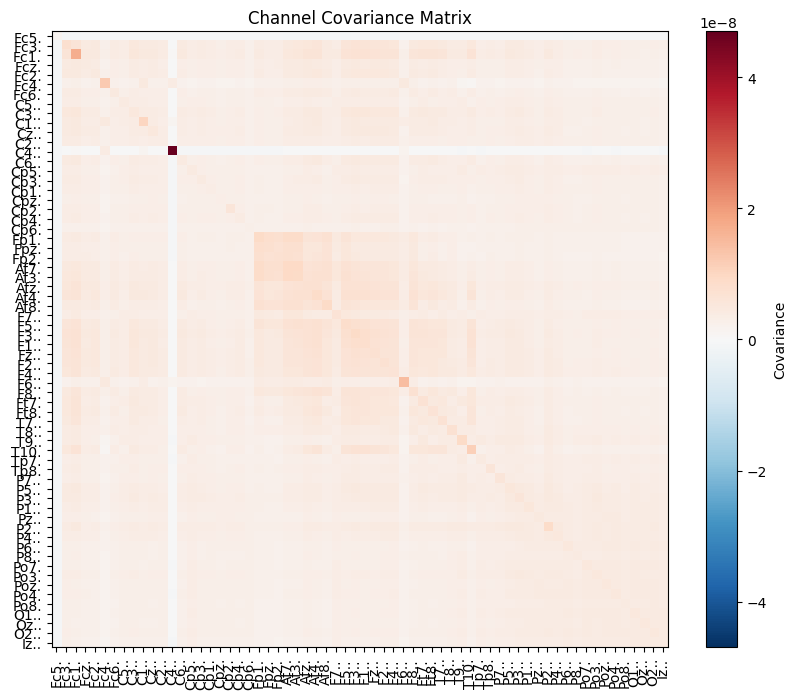

In [12]:
import matplotlib.pyplot as plt

cov = np.cov(data)
plt.figure(figsize=(10,8))
plt.imshow(cov, cmap='RdBu_r', vmin=-np.max(np.abs(cov)), vmax=np.max(np.abs(cov)))
plt.colorbar(label='Covariance')
plt.title('Channel Covariance Matrix')
plt.xticks(range(len(combined_raw.ch_names)), combined_raw.ch_names, rotation=90)
plt.yticks(range(len(combined_raw.ch_names)), combined_raw.ch_names)
plt.show()


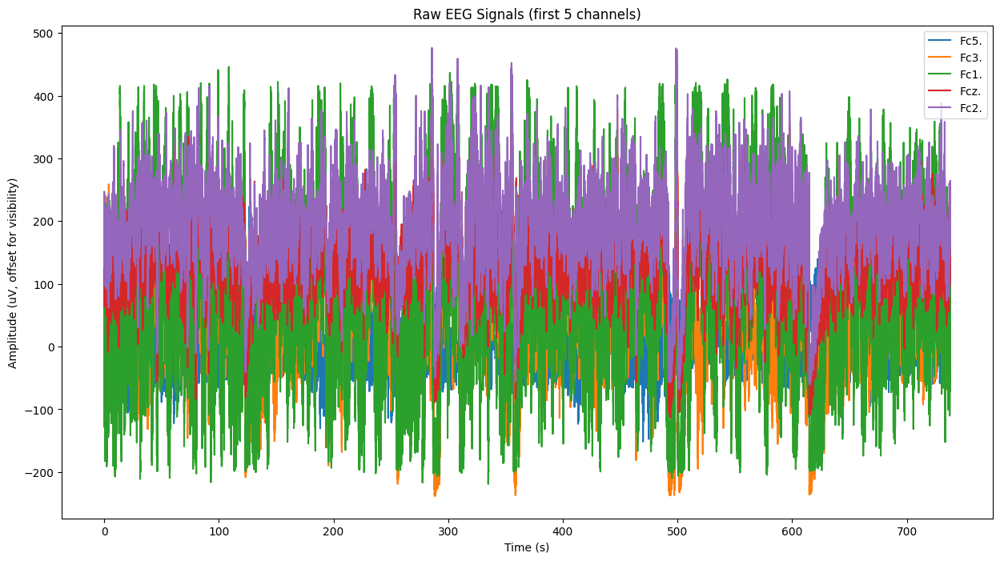

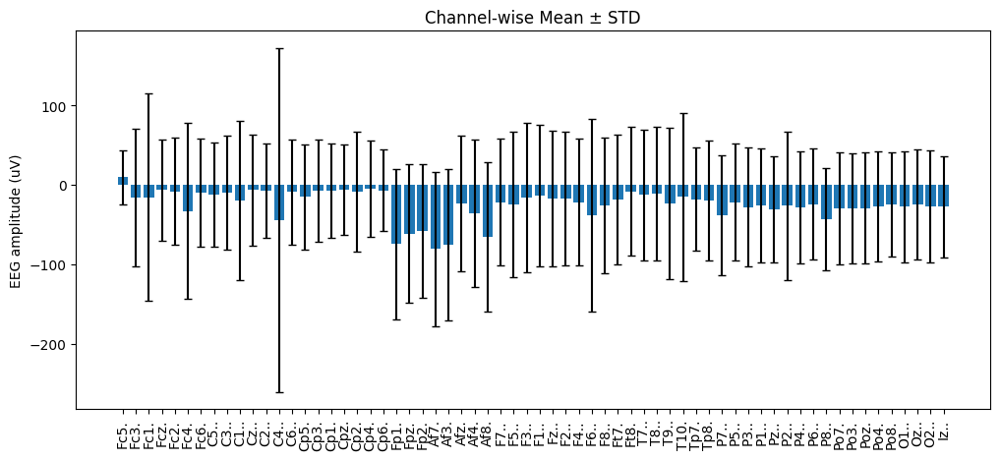

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 16.000 (s)
Plotting power spectral density (dB=True).
Need more than one channel to make topography for eeg. Disabling interactivity.


/tmp/ipython-input-404460220.py:33: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  combined_raw.plot_psd(fmin=1, fmax=50, picks=[0])  # pick first channel


<Figure size 1000x400 with 0 Axes>

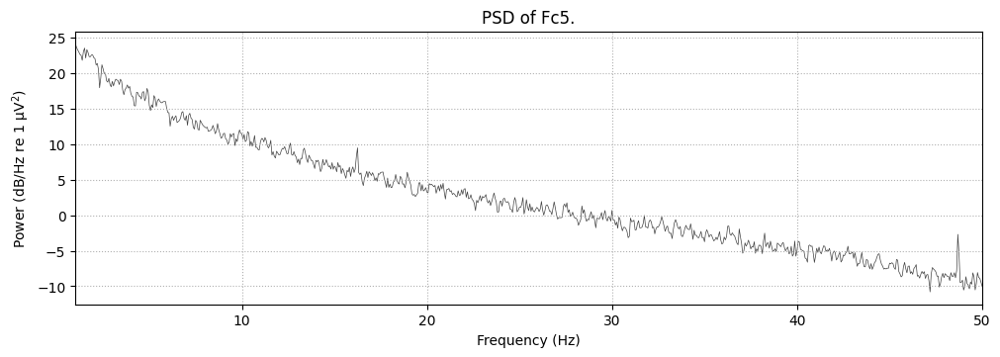

NOTE: plot_psd_topomap() is a legacy function. New code should use .compute_psd().plot_topomap().
Effective window size : 16.000 (s)


Topomap visualization failed: No digitization points found.


In [13]:
import matplotlib.pyplot as plt
import mne
import numpy as np

data = combined_raw.get_data()  # (n_channels, n_times)
sfreq = combined_raw.info['sfreq']
ch_names = combined_raw.ch_names
times = np.arange(data.shape[1]) / sfreq

# 1️⃣ Plot raw EEG for first 5 channels
plt.figure(figsize=(15, 8))
for i in range(5):
    plt.plot(times, data[i]*1e6 + i*50, label=ch_names[i])  # scale to microvolts
plt.xlabel("Time (s)")
plt.ylabel("Amplitude (uV, offset for visibility)")
plt.title("Raw EEG Signals (first 5 channels)")
plt.legend()
plt.show()

# 2️⃣ Channel-wise mean and std
means = np.mean(data, axis=1) * 1e6
stds = np.std(data, axis=1) * 1e6

plt.figure(figsize=(12,5))
plt.bar(ch_names, means, yerr=stds, capsize=3)
plt.xticks(rotation=90)
plt.ylabel("EEG amplitude (uV)")
plt.title("Channel-wise Mean ± STD")
plt.show()

# 3️⃣ Power Spectral Density (PSD) for a channel
plt.figure(figsize=(10,4))
combined_raw.plot_psd(fmin=1, fmax=50, picks=[0])  # pick first channel
plt.title(f"PSD of {ch_names[0]}")
plt.show()

# 4️⃣ Optional: Topomap (requires info['chs'] locs)
try:
    combined_raw.plot_psd_topomap(ch_type='eeg', normalize=True)
except Exception as e:
    print("Topomap visualization failed:", e)


In [ ]:
total_subjects = 109

# Filtering parameters
NOTCH_FREQ = 50        # (or 60 depending on country)
BANDPASS_LOWER = 0.5   # Hz
BANDPASS_UPPER = 40.0  # Hz

for i in range(1, total_subjects + 1):

    subject_name = f'S{i:03d}'
    file_path = os.path.join(base_data_path, subject_name, f'{subject_name}_combined_raw.fif')

    print(f"Processing {subject_name}...")

    # Load raw
    raw = mne.io.read_raw_fif(file_path, preload=True)

    # ------------------------------
    # 1) Apply Notch Filter (remove 50/60 Hz power line)
    # ------------------------------
    raw.notch_filter(
        freqs=NOTCH_FREQ,
        picks='eeg',
        method='spectrum_fit'
    )

    # ------------------------------
    # 2) Band-pass filter (keep MI-relevant frequencies)
    # ------------------------------
    raw.filter(
        l_freq=BANDPASS_LOWER,
        h_freq=BANDPASS_UPPER,
        picks='eeg',
        method='fir',
        fir_design='firwin'
    )




Filtering raw data in 6 contiguous segments
Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.62 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 50.88 Hz)
- Filter length: 845 samples (6.602 s)

Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.62 Hz
- Upper transition bandwidth:

<RawEDF | S109R07.edf, 64 x 94464 (738.0 s), ~46.2 MiB, data loaded>

Effective window size : 16.000 (s)


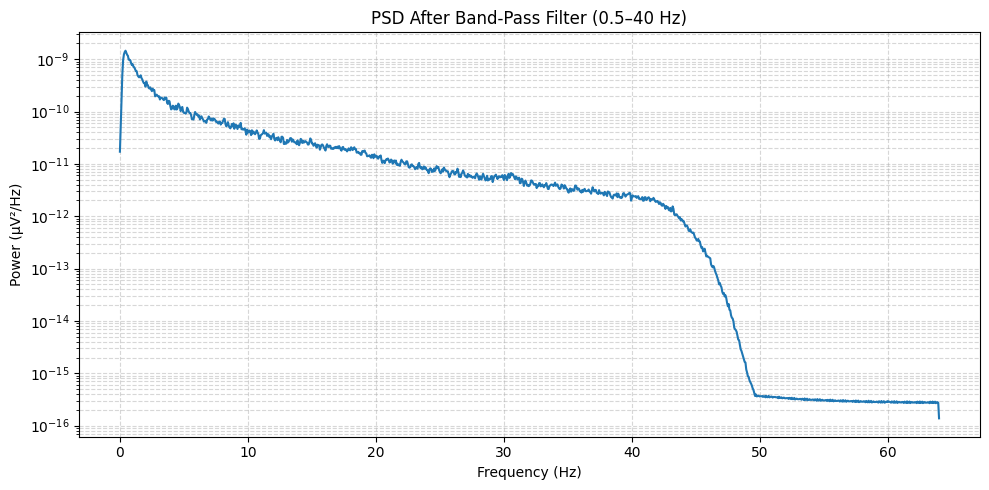

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from mne.time_frequency import psd_array_welch

# Choose a sample recording to visualize
sample_raw = combined_raw  # Replace with your Raw object
sfreq = sample_raw.info['sfreq']

# Compute PSD using Welch's method
psd, freqs = psd_array_welch(sample_raw.get_data(), sfreq=sfreq, fmin=0, fmax=80, n_fft=2048)
psd_mean = np.mean(psd, axis=0)  # average across channels

# Plot PSD
plt.figure(figsize=(10, 5))
plt.semilogy(freqs, psd_mean)
plt.title("PSD After Band-Pass Filter (0.5–40 Hz)")
plt.xlabel("Frequency (Hz)")
plt.ylabel("Power (µV²/Hz)")
plt.grid(True, which='both', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


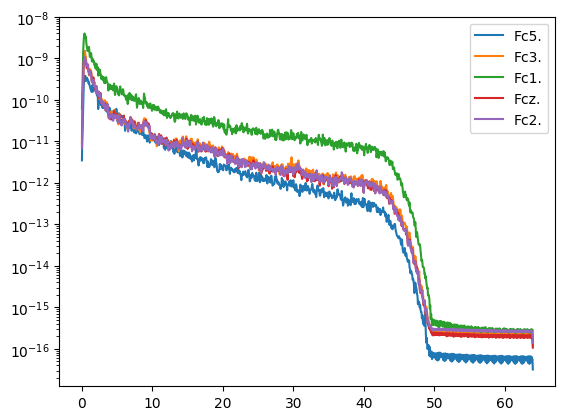

In [ ]:
for i, ch in enumerate(sample_raw.ch_names[:5]):  # first 5 channels
    plt.semilogy(freqs, psd[i], label=ch)
plt.legend()

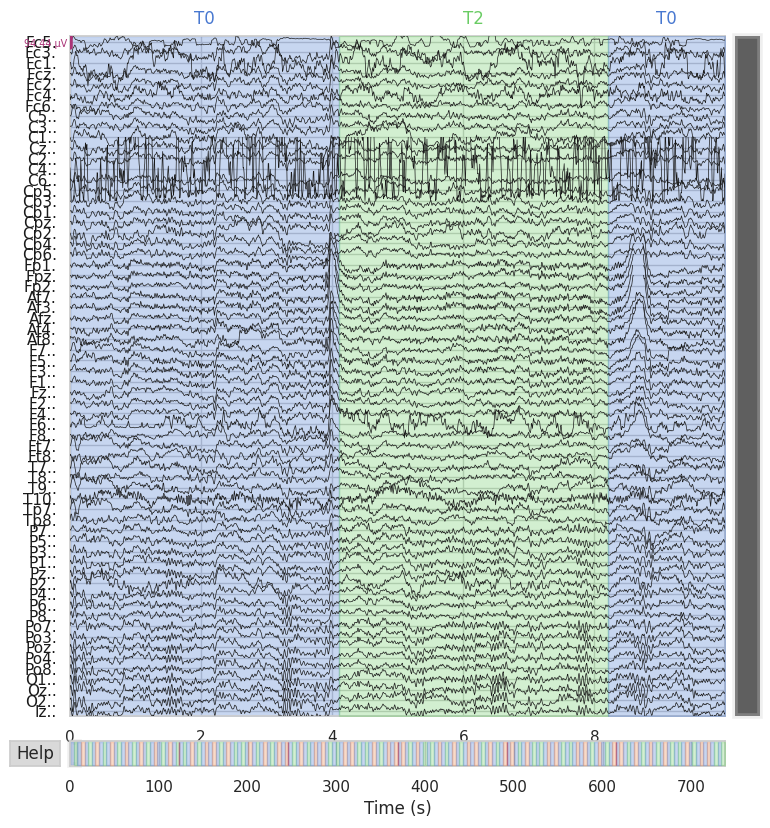

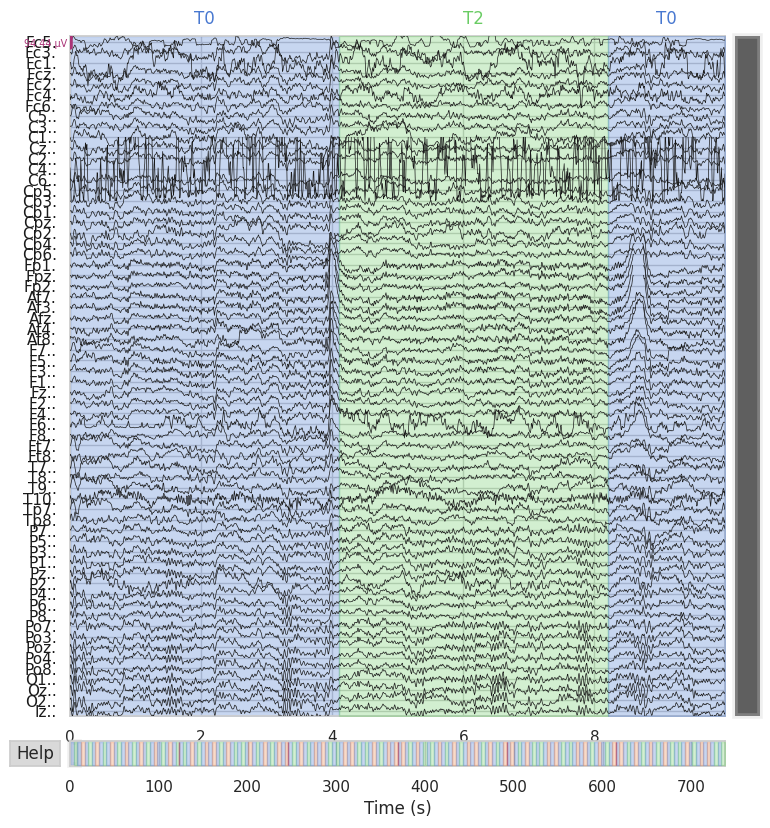

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Modern style
sns.set(style="whitegrid", palette="muted", font_scale=1.0)


# Plot
combined_raw.plot(
    n_channels=64,
    duration=10,
    scalings='auto',
    title='EEG Signals — Before Interpolation',
    butterfly=False
)

In [ ]:
# Interpolate bad channels using spherical spline method
combined_raw.interpolate_bads(reset_bads=True, mode='accurate')

Setting channel interpolation method to {'eeg': 'spline'}.


/tmp/ipython-input-3391879240.py:2: RuntimeWarning: No bad channels to interpolate. Doing nothing...
  combined_raw.interpolate_bads(reset_bads=True, mode='accurate')


<RawEDF | S109R07.edf, 64 x 94464 (738.0 s), ~46.2 MiB, data loaded>

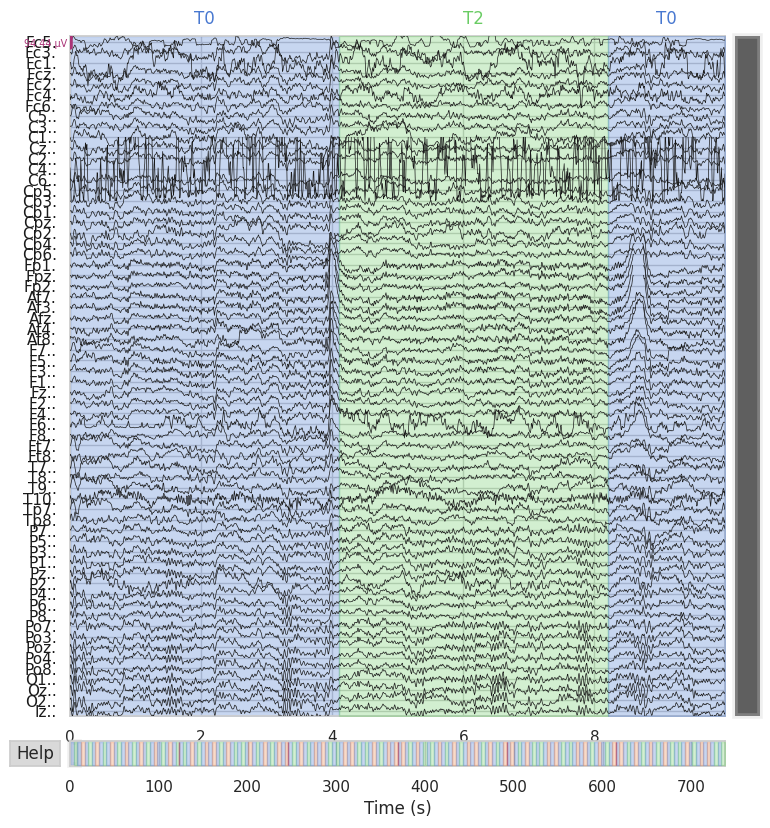

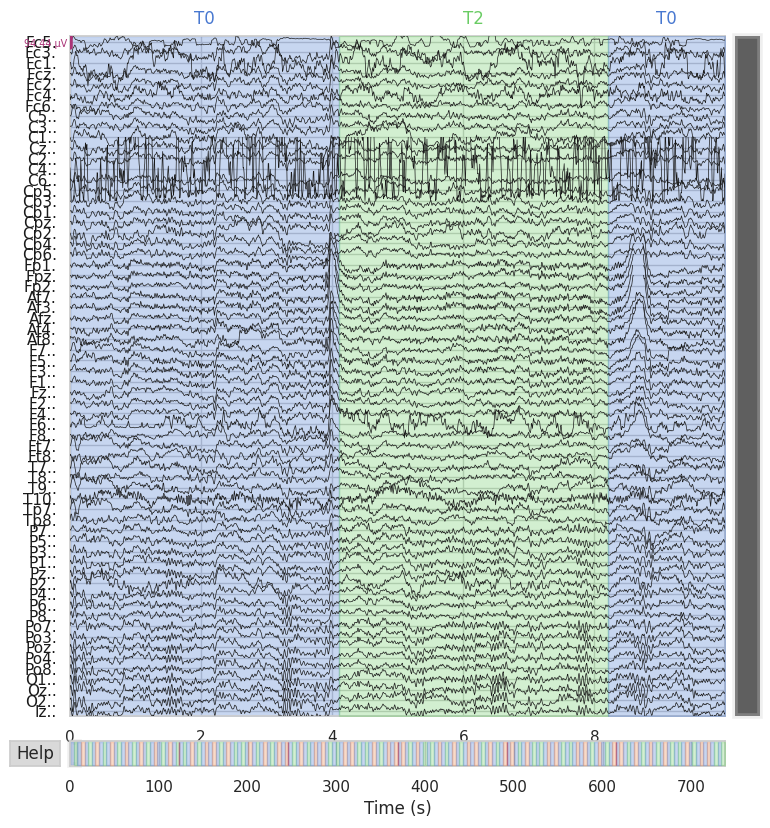

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Modern style
sns.set(style="whitegrid", palette="muted", font_scale=1.0)


# Plot
combined_raw.plot(
    n_channels=64,
    duration=10,
    scalings='auto',
    title='EEG Signals — After Interpolation',
    butterfly=False
)


In [ ]:
# Set average reference
combined_raw.set_eeg_reference('average', projection=False)

# Check reference
print(combined_raw.info['custom_ref_applied'])  # Should be True


EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
1 (FIFFV_MNE_CUSTOM_REF_ON)


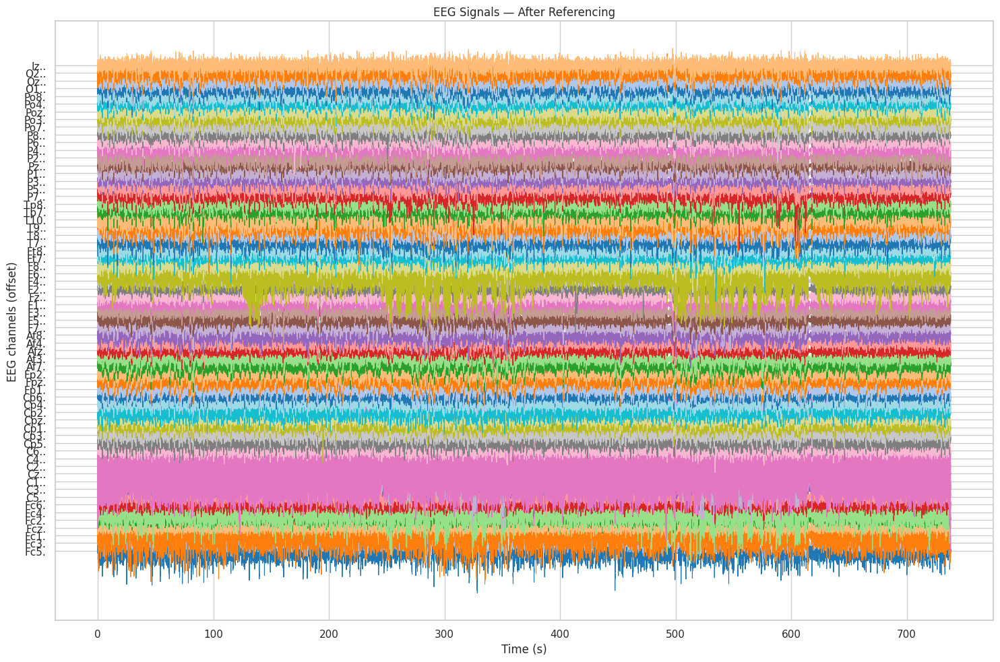

In [ ]:
# Plot after referencing
plt.figure(figsize=(15, 10))
data = combined_raw.get_data()
times = combined_raw.times
ch_names = combined_raw.ch_names

colors = sns.color_palette("tab20", n_colors=20)
colors_64 = [colors[i % 20] for i in range(len(ch_names))]

offsets = np.arange(len(ch_names)) * 50e-6

for i, ch in enumerate(ch_names):
    plt.plot(times, data[i] + offsets[i], color=colors_64[i], lw=0.8)

plt.xlabel("Time (s)")
plt.ylabel("EEG channels (offset)")
plt.title("EEG Signals — After Referencing")
plt.yticks(offsets, ch_names)
plt.tight_layout()
plt.show()


In [ ]:
print(combined_raw.ch_names)


['Fc5.', 'Fc3.', 'Fc1.', 'Fcz.', 'Fc2.', 'Fc4.', 'Fc6.', 'C5..', 'C3..', 'C1..', 'Cz..', 'C2..', 'C4..', 'C6..', 'Cp5.', 'Cp3.', 'Cp1.', 'Cpz.', 'Cp2.', 'Cp4.', 'Cp6.', 'Fp1.', 'Fpz.', 'Fp2.', 'Af7.', 'Af3.', 'Afz.', 'Af4.', 'Af8.', 'F7..', 'F5..', 'F3..', 'F1..', 'Fz..', 'F2..', 'F4..', 'F6..', 'F8..', 'Ft7.', 'Ft8.', 'T7..', 'T8..', 'T9..', 'T10.', 'Tp7.', 'Tp8.', 'P7..', 'P5..', 'P3..', 'P1..', 'Pz..', 'P2..', 'P4..', 'P6..', 'P8..', 'Po7.', 'Po3.', 'Poz.', 'Po4.', 'Po8.', 'O1..', 'Oz..', 'O2..', 'Iz..']


In [ ]:
from mne.preprocessing import ICA, create_eog_epochs

# Initialize ICA
ica = ICA(n_components=20, random_state=97, max_iter='auto')
ica.fit(combined_raw)


# Detect EOG components
eog_chs = ['Fp1.', 'Fp2.', 'Fpz.', 'Af3.', 'Af4.', 'Afz.']
eog_indices, eog_scores = ica.find_bads_eog(combined_raw, ch_name=eog_chs, threshold=3.0)
ica.exclude = eog_indices  # Mark components to exclude

# Apply ICA to remove artifacts
combined_raw = ica.apply(combined_raw.copy())

print(f"Removed components: {ica.exclude}")


Fitting ICA to data using 64 channels (please be patient, this may take a while)
Selecting by number: 20 components
Fitting ICA took 13.9s.
Using EOG channels: Fp1., Fp2., Fpz., Af3., Af4., Afz.
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1280 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower t

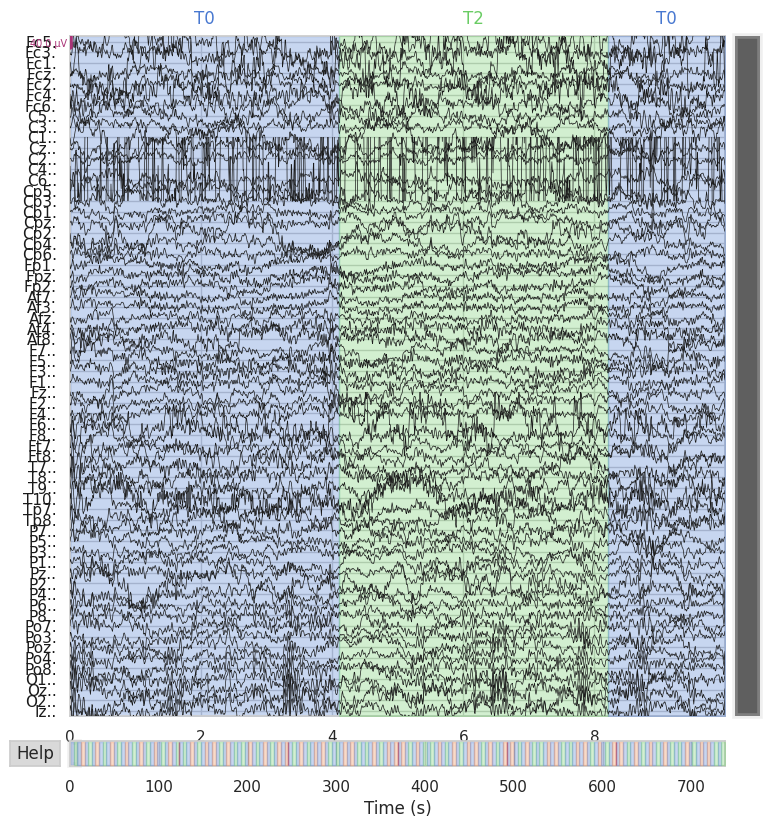

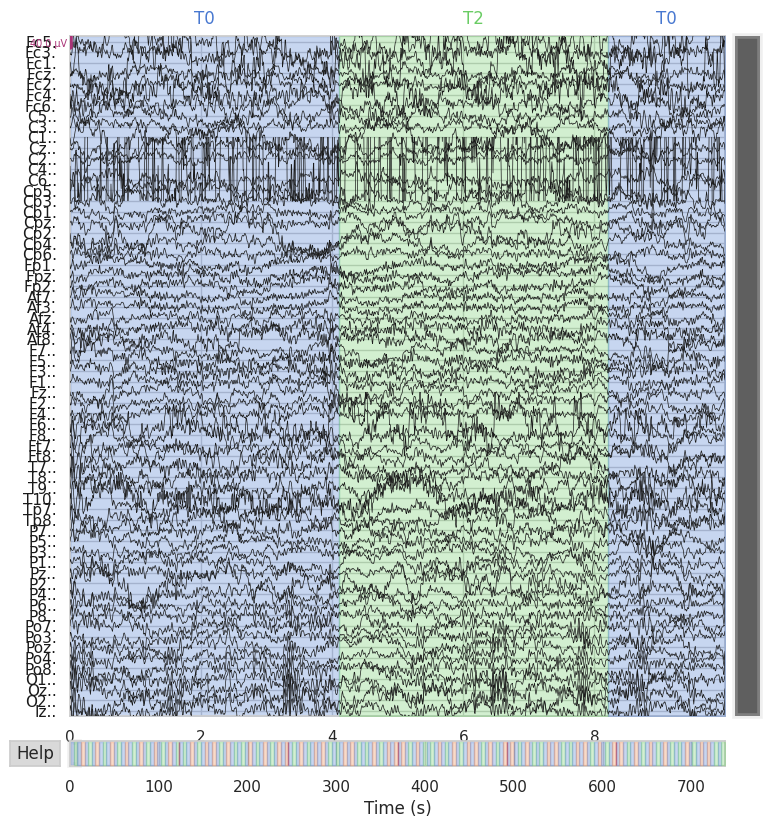

In [ ]:
combined_raw.plot(title='After ICA Artifact Removal', n_channels=64, duration=10)

In [ ]:
raw_clean = combined_raw.copy()
raw_clean = raw_clean.copy().filter(l_freq=1., h_freq=40.)
raw_clean = raw_clean.apply_function(lambda x: x, picks='eeg')  # placeholder
# Later during epoching: reject={'eeg': 150e-6} for ±150µV threshold


Filtering raw data in 6 contiguous segments
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 423 samples (3.305 s)



In [5]:
import os
import re
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import mne
from mne.time_frequency import psd_array_welch
from mne.preprocessing import ICA

sns.set(style="whitegrid", font_scale=1.0)

# === paths ===
base_data_path = r'/content/local_data/MNE-eegbci-data/files/eegmmidb/1.0.0'   # <- update
output_base = '/content/drive/MyDrive/EEG_Processed_Data'  # <-- cleaned output folder

total_subjects = 109

NOTCH_FREQ = 50.0
BANDPASS_LOWER, BANDPASS_UPPER = 0.5, 40.0
PSD_FMAX = 80.0
PSDDIR_NAME = "diagnostics"


def find_eog_candidates(ch_names):
    """Identify frontal EEG channels likely to contain EOG."""
    return [ch for ch in ch_names if re.match(r'^(Fp|AF|Fpz|AFz)', ch, flags=re.I)]


for i in range(1, total_subjects + 1):

    subj = f"S{i:03d}"
    input_folder = os.path.join(base_data_path, subj)
    input_fif = os.path.join(input_folder, f"{subj}_combined_raw.fif")

    if not os.path.exists(input_fif):
        print(f"[SKIP] {subj} not found")
        continue

    print(f"\n Processing {subj} ...")

    # ==== Create subject output folder ====
    output_folder = os.path.join(output_base, subj)
    os.makedirs(output_folder, exist_ok=True)

    diag_folder = os.path.join(output_folder, PSDDIR_NAME)
    os.makedirs(diag_folder, exist_ok=True)

    # ---- Load data ----
    raw = mne.io.read_raw_fif(input_fif, preload=True, verbose=False)

    # ---- Notch filter ----
    try:
        raw.notch_filter(freqs=NOTCH_FREQ, picks='eeg', method='spectrum_fit', verbose=False)
    except:
        raw.notch_filter(freqs=NOTCH_FREQ, picks='eeg', verbose=False)

    # ---- Band-pass filter ----
    raw.filter(l_freq=BANDPASS_LOWER, h_freq=BANDPASS_UPPER,
               picks='eeg', method='fir', fir_design='firwin', verbose=False)

    # ==== PSD computation ====
    data = raw.get_data(picks='eeg')
    sfreq = raw.info['sfreq']
    psd, freqs = psd_array_welch(data, sfreq=sfreq, fmin=0, fmax=PSD_FMAX, n_fft=2048)
    psd_mean = psd.mean(axis=0)

    # Mean PSD
    plt.figure(figsize=(8, 4))
    plt.semilogy(freqs, psd_mean)
    plt.title(f"{subj} PSD Mean ({BANDPASS_LOWER}-{BANDPASS_UPPER} Hz)")
    plt.xlabel("Hz"); plt.ylabel("Power")
    plt.tight_layout()
    plt.savefig(os.path.join(diag_folder, f"{subj}_psd_mean.png"))
    plt.close()

    # First 5 channels PSD
    plt.figure(figsize=(8, 4))
    for j, ch in enumerate(raw.ch_names[:5]):
        plt.semilogy(freqs, psd[j], label=ch)
    plt.legend(); plt.tight_layout()
    plt.savefig(os.path.join(diag_folder, f"{subj}_psd_5ch.png"))
    plt.close()

    # ==== Interpolate bad channels ====
    bads = raw.info.get('bads', [])
    if bads:
        try:
            raw.interpolate_bads(reset_bads=True, mode='accurate')
        except:
            raw.interpolate_bads(reset_bads=True)

    # ==== Average reference ====
    raw.set_eeg_reference('average', projection=False)

    # ==== ICA - safe minimum ====
    try:
        ICA_N = min(20, raw.info['nchan'] - 1)
        ica = ICA(n_components=ICA_N, random_state=97, max_iter='auto')
        ica.fit(raw)

        eog_ch = find_eog_candidates(raw.ch_names)
        if eog_ch:
            try:
                eog_inds, scores = ica.find_bads_eog(raw, ch_name=eog_ch, threshold=3.0)
                ica.exclude = eog_inds
            except:
                ica.exclude = []
        else:
            ica.exclude = []

        if ica.exclude:
            raw = ica.apply(raw.copy())

    except Exception as e:
        print(" ICA failed:", str(e))

    # ==== Final filter before saving ====
    raw_clean = raw.copy().filter(l_freq=1., h_freq=40., picks='eeg', verbose=False)

    # ==== SAVE cleaned file ====
    cleaned_path = os.path.join(output_folder, f"{subj}_cleaned_raw.fif")
    raw_clean.save(cleaned_path, overwrite=True)

    # === Save summary ===
    with open(os.path.join(diag_folder, f"{subj}_summary.txt"), "w") as f:
        f.write(f"subject: {subj}\n")
        f.write(f"input file: {input_fif}\n")
        f.write(f"cleaned file: {cleaned_path}\n")
        f.write(f"channels: {len(raw_clean.ch_names)}\n")
        f.write(f"ICA removed: {ica.exclude if 'ica' in locals() else 'none'}\n")

    print(f" lSaved cleaned: {cleaned_path}")


print("\n🎉 All subjects processed.")



Streaming output truncated to the last 5000 lines.
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1280 samples (10.000 s)

... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1280 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter

/usr/local/lib/python3.12/dist-packages/sklearn/decomposition/_fastica.py:127: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(


Streaming output truncated to the last 5000 lines.
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1280 samples (10.000 s)

... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1280 samples (10.000 s)

... filtering targe

In [3]:
import numpy as np
import mne
import os
from pathlib import Path
from glob import glob
from sklearn.model_selection import train_test_split
from collections import Counter
import warnings
import gc

# =========================================================================
# I. CONFIGURATION
# =========================================================================

TOTAL_SUBJECTS = 109
TARGET_SFREQ = 128.0 # <-- NEW: Set the target sampling frequency

# Now point to the cleaned output directory you requested
base_data_path = Path('/content/drive/MyDrive/EEG_Processed_Data')

# Runs Configuration (Crucial for 4-Class Mapping)
runs_in_order = [7, 8, 9, 10, 13, 14]
hand_runs = [7, 8, 13, 14]  # T2 maps to Right (2)
feet_runs = [9, 10]         # T2 maps to Forward (3)
expected_num_runs = len(runs_in_order)
event_id_4class = { 'Rest':0, 'Left':1, 'Right':2, 'Forward':3 }
min_segment_len = 5  # Heuristic for merging tiny segments

# =========================================================================
# II. MAIN PROCESSING LOOP: Load, Epoch, and Collect NumPy Arrays (Memory Optimized)
# =========================================================================

all_X = []
all_y = []
total_epochs_count = 0

print(f"Starting memory-optimized loading and epoching, TARGET SFREQ: {TARGET_SFREQ}Hz...")

with warnings.catch_warnings():
    warnings.simplefilter("ignore")

    for i in range(1, TOTAL_SUBJECTS + 1):
        subject_name = f'S{i:03d}'
        subject_folder = base_data_path / subject_name

        # cleaned file expected under: /content/drive/MyDrive/EEG_Processed_Data/Sxxx/Sxxx_cleaned_raw.fif
        cleaned_file = subject_folder / f"{subject_name}_cleaned_raw.fif"

        if not cleaned_file.exists():
            if i % 10 == 1:
                print(f"[SKIP] {subject_name}: cleaned file not found at {cleaned_file}")
            continue

        try:
            combined_raw = mne.io.read_raw_fif(cleaned_file, preload=True, verbose=False)
        except Exception as e:
            print(f"[ERROR] {subject_name}: failed to read {cleaned_file}: {e}")
            continue

        # -------------------------------------------------------------
        # 🧠 CRITICAL OPTIMIZATION: RESAMPLE HERE
        # -------------------------------------------------------------
        if combined_raw.info['sfreq'] != TARGET_SFREQ:
            # Resample in-place to the target frequency (128.0 Hz)
            combined_raw.resample(TARGET_SFREQ, npad='auto', verbose=False)
            # Update sfreq variable to be used later
        sfreq = combined_raw.info['sfreq']
        # -------------------------------------------------------------

        # --- Epoching Logic (Same as before) ---
        annotations = combined_raw.annotations

        if annotations is None or len(annotations) == 0:
            print(f"[SKIP] {subject_name}: no annotations found, skipping.")
            del combined_raw
            gc.collect()
            continue

        try:
            events, event_dict = mne.events_from_annotations(combined_raw)
        except Exception as e:
            print(f"[ERROR] {subject_name}: events_from_annotations failed: {e}")
            del combined_raw
            gc.collect()
            continue

        # 2. Run Segmentation (merge boundary sections)
        boundary_labels = {'BAD boundary', 'EDGE boundary'}
        desc_list = [str(a['description']) for a in annotations]
        boundary_idx = [idx for idx, d in enumerate(desc_list) if d in boundary_labels]

        # Create initial segments between boundaries
        segment_edges = [-1] + boundary_idx + [len(desc_list) - 1]
        segments = []
        for s in range(len(segment_edges) - 1):
            start = segment_edges[s] + 1
            end = segment_edges[s + 1]
            if start <= end:
                segments.append((start, end))

        # Aggressive merging of tiny segments
        merged = []
        for s, e in segments:
            length = e - s + 1
            if len(merged) > 0 and length < min_segment_len:
                last_s, last_e = merged.pop()
                merged.append((last_s, e))
            else:
                merged.append((s, e))
        segments = merged

        if len(segments) != expected_num_runs:
            if i % 10 == 0:
                print(f"[SEGMENT FAIL] {subject_name}: found {len(segments)} segments (expected {expected_num_runs}) - skipping")
            del combined_raw
            gc.collect()
            continue

        # Assign run number to each annotation index
        full_run_list = np.empty(len(desc_list), dtype=int)
        for seg_idx, (s, e) in enumerate(segments):
            runnum = runs_in_order[seg_idx]
            full_run_list[s:e+1] = runnum

        # 3. Context-Dependent Event Mapping (T0/T1/T2 -> 0/1/2/3)
        mapped_events = events.copy()
        # sfreq is now 128.0 Hz (or whatever TARGET_SFREQ is)

        for ann_idx, ann in enumerate(annotations):
            desc = str(ann['description'])
            try:
                run = int(full_run_list[ann_idx])
            except Exception:
                continue

            if desc not in ('T0', 'T1', 'T2'):
                continue

            onset_sec = ann['onset']
            # Use the resampled sfreq to find the sample index
            sample = int(round(onset_sec * sfreq))

            # Map T0, T1, T2 to classes
            if desc == 'T0':
                new_val = 0
            elif desc == 'T1':
                new_val = 1
            elif desc == 'T2':
                new_val = 2 if run in hand_runs else 3
            else:
                continue

            # Find the nearest event sample and set its event id
            close_idx = np.where(np.abs(events[:, 0] - sample) <= 1)[0]
            if close_idx.size > 0:
                mapped_events[close_idx, 2] = new_val
            else:
                nearest_idx = np.argmin(np.abs(events[:, 0] - sample))
                mapped_events[nearest_idx, 2] = new_val

        # 4. Create Epochs, Drop Bad, and COLLECT NUMPY ARRAYS
        try:
            epochs_subject = mne.Epochs(
                combined_raw, mapped_events, event_id=event_id_4class,
                tmin=-0.2, tmax=4.0, baseline=(-0.2, 0), preload=True, verbose=False
            )
        except Exception as e:
            print(f"[ERROR] {subject_name}: creating Epochs failed: {e}")
            del combined_raw
            gc.collect()
            continue

        # drop bad epochs (if any)
        try:
            epochs_subject.drop_bad()
        except Exception:
            pass

        num_epochs = len(epochs_subject)
        if num_epochs > 0:
            all_X.append(epochs_subject.get_data())
            all_y.append(epochs_subject.events[:, 2])
            total_epochs_count += num_epochs

        # clean up large objects & force GC
        del combined_raw
        del epochs_subject
        gc.collect()

        # sparse progress print
        if i % 10 == 0:
            print(f"✅ {subject_name} processed. Total epochs collected so far: {total_epochs_count}")

# =========================================================================
# III. FINAL CONCATENATION AND VERIFICATION (Single Stack)
# =========================================================================

print("\n--- FINAL STEP: Stacking all subjects' data ---")

if total_epochs_count == 0:
    raise RuntimeError("No epochs were collected. Check file paths and loading.")

X_final = np.concatenate(all_X, axis=0)
y_final = np.concatenate(all_y, axis=0)

# Free up lists
del all_X, all_y
gc.collect()

# Calculate the new number of time points
# Epoch duration: 4.0 - (-0.2) = 4.2 seconds
# New time points: 4.2 seconds * 128 Hz = 537.6 (MNE rounds up) -> 538 time points
expected_times = int(np.round((4.0 - (-0.2)) * TARGET_SFREQ)) + 1 # +1 for t=0

print(f"\n🎉 Total Final Epochs Collected: **{X_final.shape[0]}**")

class_counts = Counter(y_final)
print("Epochs per class (Final Dataset):", class_counts)

print("\n| Class ID | Class Name | Epoch Count |")
print("| :--- | :--- | :--- |")
print(f"| 0 | Rest | {class_counts.get(0, 0)} |")
print(f"| 1 | Left | {class_counts.get(1, 0)} |")
print(f"| 2 | Right | {class_counts.get(2, 0)} |")
print(f"| 3 | Forward | {class_counts.get(3, 0)} |")
print(f"\nFinal data shape: **{X_final.shape}** (Epochs, Channels, Times)")
print(f"Expected number of time points at 128Hz: {expected_times}")


Starting memory-optimized loading and epoching, TARGET SFREQ: 128.0Hz...
Used Annotations descriptions: [np.str_('T0'), np.str_('T1'), np.str_('T2')]
Used Annotations descriptions: [np.str_('T0'), np.str_('T1'), np.str_('T2')]
Used Annotations descriptions: [np.str_('T0'), np.str_('T1'), np.str_('T2')]
Used Annotations descriptions: [np.str_('T0'), np.str_('T1'), np.str_('T2')]
Used Annotations descriptions: [np.str_('T0'), np.str_('T1'), np.str_('T2')]
Used Annotations descriptions: [np.str_('T0'), np.str_('T1'), np.str_('T2')]
Used Annotations descriptions: [np.str_('T0'), np.str_('T1'), np.str_('T2')]
Used Annotations descriptions: [np.str_('T0'), np.str_('T1'), np.str_('T2')]
Used Annotations descriptions: [np.str_('T0'), np.str_('T1'), np.str_('T2')]
Used Annotations descriptions: [np.str_('T0'), np.str_('T1'), np.str_('T2')]
✅ S010 processed. Total epochs collected so far: 1740
Used Annotations descriptions: [np.str_('T0'), np.str_('T1'), np.str_('T2')]
Used Annotations descripti

In [4]:
# basic info
print("X_final shape:", X_final.shape)
print("X_final dtype:", X_final.dtype)
print("y_final shape:", y_final.shape)
print("y_final dtype:", y_final.dtype)

# class counts
from collections import Counter
print("Class counts:", Counter(y_final.tolist()))

# inspect first epoch
print("Example epoch 0: min, max, mean, std:",
      X_final[0].min(), X_final[0].max(), X_final[0].mean(), X_final[0].std())

# show unique labels
print("Unique labels:", np.unique(y_final))

X_final shape: (18968, 64, 539)
X_final dtype: float64
y_final shape: (18968,)
y_final dtype: int64
Class counts: Counter({0: 9184, 1: 4896, 2: 3254, 3: 1634})
Example epoch 0: min, max, mean, std: -0.0001207313726555325 0.00012644699226117294 8.741940622613307e-15 2.999141991520306e-05
Unique labels: [0 1 2 3]


In [5]:
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
from collections import Counter
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (Input, Conv2D, BatchNormalization,
                                     Activation, DepthwiseConv2D,
                                     AveragePooling2D, Dropout, Flatten, Dense)
from tensorflow.keras.constraints import max_norm
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
import gc # Garbage Collection

# =========================================================================
# I. DATA PREPARATION (Aggressive Memory Cleanup)
# =========================================================================

print("--- Starting Aggressive Memory Optimization for EEGNet ---")

# --- 1. Load Data ---
try:
    # CRITICAL: Use .astype(np.float32) and .copy() right away to enforce type and
    # break reference from the huge X_final/y_final array, allowing deletion.
    X = X_final.astype(np.float32)   # Enforce float32 (half memory of float64)
    y = y_final.copy()               # Copy labels (small array)

    # Immediately delete the original massive arrays if they are still present
    del X_final
    del y_final
    gc.collect()

    print(f"✅ Loaded and cast data: X shape {X.shape} (float32), y shape {y.shape}")

except NameError:
    print("⚠️ Error: X_final or y_final not found. Cannot proceed without data.")
    raise

# --- 2. Standardize per-channel (using in-place operations) ---
mean = X.mean(axis=(0,2), keepdims=True)
std  = X.std(axis=(0,2), keepdims=True)
std  = np.where(std==0, 1e-8, std)

# Use in-place subtraction and division to avoid creating temporary copies of X
X -= mean
X /= std

del mean
del std
gc.collect()

# --- 3. Train/validation/test split (60% Train / 20% Val / 20% Test) ---
test_split_ratio = 0.2
val_split_ratio_of_train_val = 0.25

# NOTE: train_test_split *always* returns copies, but we manage them quickly.
X_train_val, X_test, y_train_val, y_test = train_test_split(
    X, y, test_size=test_split_ratio, random_state=42, stratify=y
)

# Immediately delete the largest array (X) after splitting the first time
del X
del y
gc.collect()

X_train, X_val, y_train, y_val = train_test_split(
    X_train_val, y_train_val, test_size=val_split_ratio_of_train_val, random_state=42, stratify=y_train_val
)

# Immediately delete the large intermediate arrays
del X_train_val
del y_train_val
gc.collect()

# --- 4. Reshape for EEGNet ---
# CRITICAL: Reshape using np.newaxis is view-based (no copy)
X_train = X_train[..., np.newaxis]
X_val   = X_val[..., np.newaxis]
X_test  = X_test[..., np.newaxis]

n_channels = X_train.shape[1]
n_times = X_train.shape[2]
classes = np.unique(y_train) # Use y_train for classes, as it's the largest subset
n_classes = len(classes)
batch_size = 64

# --- 5. Compute Class Weights ---
class_weights = compute_class_weight('balanced', classes=classes, y=y_train)
class_weights_dict = dict(zip(classes, class_weights))
print(f"\nWeighted class distribution (y_train count: {len(y_train)}):")
print("Class weights:", class_weights_dict)

# =========================================================================
# II. MODEL DEFINITION (Unchanged - Architecture is not the memory issue)
# =========================================================================

def EEGNet_Regulated(nb_classes, Chans, Samples, dropoutRate=0.6, kernLength=32, F1=8, D=2, F2=16, norm_rate=0.15, dropoutType='SpatialDropout2D'):
    dropout_layers = {'Dropout': Dropout, 'SpatialDropout2D': tf.keras.layers.SpatialDropout2D}
    dropout_layer = dropout_layers[dropoutType]

    input1 = Input(shape=(Chans, Samples, 1))
    block1 = Conv2D(F1, (1,kernLength), padding='same', use_bias=False)(input1)
    block1 = BatchNormalization()(block1)
    block1 = DepthwiseConv2D((Chans,1), depth_multiplier=D, use_bias=False,
                             depthwise_constraint=max_norm(0.5))(block1)
    block1 = BatchNormalization()(block1)
    block1 = Activation('elu')(block1)
    block1 = AveragePooling2D((1,4))(block1)
    block1 = dropout_layer(dropoutRate)(block1)

    block2 = Conv2D(F2, (1,16), use_bias=False, activation='linear', padding='same')(block1)
    block2 = BatchNormalization()(block2)
    block2 = Activation('elu')(block2)
    block2 = AveragePooling2D((1,8))(block2)
    block2 = dropout_layer(dropoutRate)(block2)

    flatten = Flatten()(block2)
    dense = Dense(nb_classes, kernel_constraint=max_norm(norm_rate))(flatten)
    softmax = Activation('softmax')(dense)

    return Model(inputs=input1, outputs=softmax)

# --- MixUp Generator (Unchanged - already optimized for batches) ---
def mixup_generator(X, y, class_weights_dict, batch_size, alpha=0.2):
    n_samples = X.shape[0]
    weights_lookup = {int(k): v for k, v in class_weights_dict.items()}

    while True:
        indices = np.random.permutation(n_samples)

        for start_idx in range(0, n_samples, batch_size):
            end_idx = min(start_idx + batch_size, n_samples)
            batch_indices = indices[start_idx:end_idx]
            mix_indices = np.random.permutation(batch_indices)

            X_batch = X[batch_indices]
            y_batch = y[batch_indices]
            X_mix = X[mix_indices]
            y_mix = y[mix_indices]

            lam = np.random.beta(alpha, alpha)

            X_out = lam * X_batch + (1. - lam) * X_mix

            y_out_onehot = tf.keras.utils.to_categorical(y_batch, num_classes=n_classes)
            y_mix_onehot = tf.keras.utils.to_categorical(y_mix, num_classes=n_classes)
            y_out = lam * y_out_onehot + (1. - lam) * y_mix_onehot

            weights_batch = np.array([weights_lookup[label] for label in y_batch])
            weights_mix = np.array([weights_lookup[label] for label in y_mix])
            sample_weights = lam * weights_batch + (1. - lam) * weights_mix

            yield X_out, y_out, sample_weights

# =========================================================================
# III. TRAINING AND EVALUATION
# =========================================================================

# Instantiate model
model = EEGNet_Regulated(nb_classes=n_classes, Chans=n_channels, Samples=n_times)

# Model Compilation
model.compile(
    loss='categorical_crossentropy',
    optimizer=Adam(learning_rate=0.0003),
    metrics=['accuracy']
)

# Prepare Training Data Generator
train_generator = mixup_generator(X_train, y_train, class_weights_dict, batch_size=batch_size, alpha=0.2)
y_val_onehot = tf.keras.utils.to_categorical(y_val, num_classes=n_classes)

callbacks = [
    # Reduce patience: 25 is too long if the model plateaus in 10 epochs.
    EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=8, min_lr=1e-6) # Reduce LR patience
]

# --- Training ---
print("\n🚀 Starting Model Training with MixUp...")
history = model.fit(
    train_generator,
    steps_per_epoch=len(X_train) // batch_size,
    epochs=100, # Reduce max epochs from 300 to 100
    validation_data=(X_val, y_val_onehot),
    callbacks=callbacks,
    verbose=1
)

# --- Evaluation on Test Set ---
print("\n--- Model Evaluation on Test Set ---")
y_test_onehot = tf.keras.utils.to_categorical(y_test, num_classes=n_classes)
test_results = model.evaluate(X_test, y_test_onehot, batch_size=batch_size, verbose=0)
test_loss = test_results[0]
test_accuracy = test_results[1]

print(f"✅ Test Loss: {test_loss:.4f}")
print(f"✅ Test Accuracy: {test_accuracy*100:.2f}%")


--- Starting Aggressive Memory Optimization for EEGNet ---
✅ Loaded and cast data: X shape (18968, 64, 539) (float32), y shape (18968,)

Weighted class distribution (y_train count: 11380):
Class weights: {np.int64(0): np.float64(0.5163339382940109), np.int64(1): np.float64(0.9683458134785569), np.int64(2): np.float64(1.4574795081967213), np.int64(3): np.float64(2.9030612244897958)}

🚀 Starting Model Training with MixUp...
Epoch 1/100
177/177 ━━━━━━━━━━━━━━━━━━━━ 368s 2s/step - accuracy: 0.2918 - loss: 1.3945 - val_accuracy: 0.4794 - val_loss: 1.3658 - learning_rate: 3.0000e-04
Epoch 2/100
177/177 ━━━━━━━━━━━━━━━━━━━━ 362s 2s/step - accuracy: 0.3761 - loss: 1.3795 - val_accuracy: 0.4800 - val_loss: 1.3425 - learning_rate: 3.0000e-04
Epoch 3/100
177/177 ━━━━━━━━━━━━━━━━━━━━ 356s 2s/step - accuracy: 0.4161 - loss: 1.3711 - val_accuracy: 0.4847 - val_loss: 1.3117 - learning_rate: 3.0000e-04
Epoch 4/100
177/177 ━━━━━━━━━━━━━━━━━━━━ 361s 2s/step - accuracy: 0.4451 - loss: 1.3489 - val_accura


--- Starting Comprehensive Model Evaluation ---
Generating predictions on the test set...

--- Final Test Set Metrics ---
Test Loss: 1.1601
Test Accuracy: 58.04%
Test Accuracy (sklearn): 58.04%

--- Classification Report ---
              precision    recall  f1-score   support

     Class 0       0.68      0.81      0.74      1837
     Class 1       0.55      0.43      0.48       979
     Class 2       0.44      0.33      0.38       651
     Class 3       0.22      0.23      0.22       327

    accuracy                           0.58      3794
   macro avg       0.47      0.45      0.46      3794
weighted avg       0.56      0.58      0.57      3794


Generating Training History Plots...


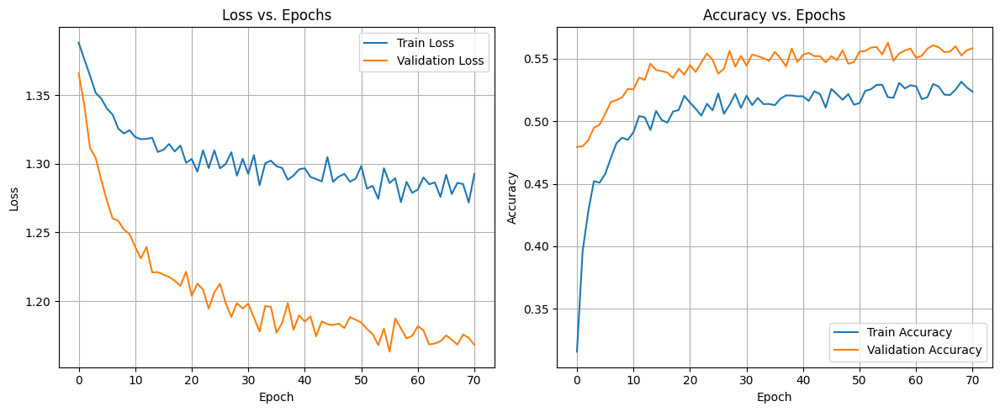

Generating Confusion Matrix Heatmap...


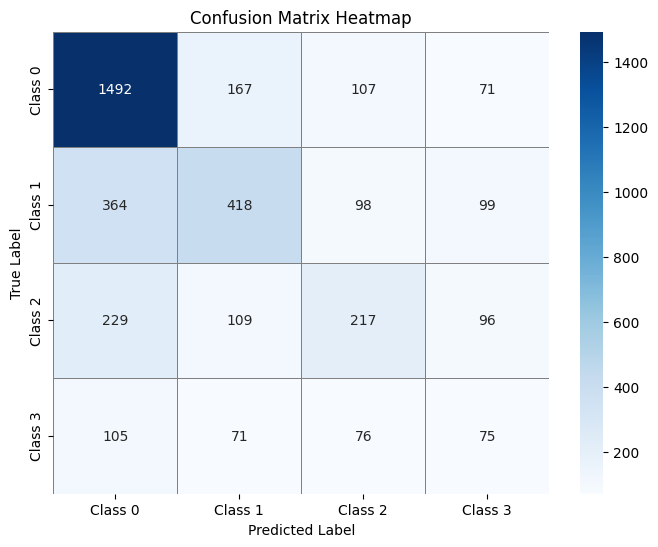


--- Per-Class Error Rate Analysis ---
Class 0: Accuracy = 0.8122, Error Rate = 0.1878 (Count: 1837)
Class 1: Accuracy = 0.4270, Error Rate = 0.5730 (Count: 979)
Class 2: Accuracy = 0.3333, Error Rate = 0.6667 (Count: 651)
Class 3: Accuracy = 0.2294, Error Rate = 0.7706 (Count: 327)

Final memory cleanup completed.

Evaluation complete.


In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from tensorflow.keras.utils import to_categorical # Used for y_test_onehot

# Assuming the following objects are available after running the training code:
# model, history, X_test, y_test, n_classes, classes

print("\n--- Starting Comprehensive Model Evaluation ---")
# =========================================================================
# I. PREDICTIONS AND METRICS CALCULATION
# =========================================================================

# 1. Generate Predictions on the Test Set
print("Generating predictions on the test set...")
# Use model.predict on the test data. This is typically memory efficient.
y_pred_probs = model.predict(X_test, batch_size=64, verbose=0)
# Convert probabilities to class labels (index with the highest probability)
y_pred = np.argmax(y_pred_probs, axis=1)

# The true labels (y_test) are already in integer format.
y_true = y_test

# 2. Final Evaluation Summary (from training script)
test_loss, test_accuracy = model.evaluate(X_test, to_categorical(y_test, num_classes=n_classes), verbose=0)
print(f"\n--- Final Test Set Metrics ---")
print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy*100:.2f}%")
print(f"Test Accuracy (sklearn): {accuracy_score(y_true, y_pred)*100:.2f}%")

# 3. Classification Report
# This provides Precision, Recall, F1-Score, and Support for each class.
print("\n--- Classification Report ---")
# Target names help label the report correctly (e.g., ['Class 0', 'Class 1', ...])
target_names = [f'Class {i}' for i in range(n_classes)]
print(classification_report(y_true, y_pred, target_names=target_names))

# =========================================================================
# II. VISUALIZATIONS
# =========================================================================

## A. Plot Training History (Loss and Accuracy)
def plot_training_history(history):
    """Plots training and validation loss and accuracy curves."""

    # Check if 'accuracy' is the correct key (could be 'acc' in older Keras/TensorFlow versions)
    acc_key = 'accuracy' if 'accuracy' in history.history else 'acc'
    val_acc_key = 'val_accuracy' if 'val_accuracy' in history.history else 'val_acc'

    plt.figure(figsize=(12, 5))

    # Plot Loss
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Train Loss')
    if 'val_loss' in history.history:
        plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Loss vs. Epochs')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    # Plot Accuracy
    plt.subplot(1, 2, 2)
    plt.plot(history.history[acc_key], label='Train Accuracy')
    if val_acc_key in history.history:
        plt.plot(history.history[val_acc_key], label='Validation Accuracy')
    plt.title('Accuracy vs. Epochs')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

print("\nGenerating Training History Plots...")
plot_training_history(history)
#

## B. Confusion Matrix Heatmap
def plot_confusion_matrix_heatmap(y_true, y_pred, class_names):
    """Generates and plots a Confusion Matrix Heatmap."""

    # 1. Compute Confusion Matrix
    cm = confusion_matrix(y_true, y_pred)

    # 2. Convert to DataFrame for easier plotting with class labels
    cm_df = pd.DataFrame(cm, index=class_names, columns=class_names)

    # 3. Create Heatmap
    plt.figure(figsize=(8, 6))
    sns.heatmap(
        cm_df,
        annot=True,          # Annotate the cells with the counts
        fmt='d',             # Format the counts as integers
        cmap='Blues',        # Color map
        cbar=True,
        linewidths=0.5,
        linecolor='gray'
    )
    plt.title('Confusion Matrix Heatmap')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()

print("Generating Confusion Matrix Heatmap...")
plot_confusion_matrix_heatmap(y_true, y_pred, target_names)
#


# =========================================================================
# III. ADDITIONAL INSIGHTS (Per-Class Error Rate)
# =========================================================================

print("\n--- Per-Class Error Rate Analysis ---")
# Calculate the total number of samples for each true class
support = np.bincount(y_true, minlength=n_classes)
# Calculate the number of correct predictions (True Positives)
correct_predictions = np.diag(confusion_matrix(y_true, y_pred))

# Calculate the number of incorrect predictions (Total False)
incorrect_predictions = support - correct_predictions

# Calculate the Error Rate
error_rate = incorrect_predictions / support

for i, rate in enumerate(error_rate):
    # Skip if support is 0, though highly unlikely with stratified split
    if support[i] > 0:
        print(f"{target_names[i]}: Accuracy = {correct_predictions[i]/support[i]:.4f}, Error Rate = {rate:.4f} (Count: {support[i]})")


# =========================================================================
# IV. MEMORY CLEANUP
# =========================================================================
# CRITICAL: Clean up prediction variables after plots are shown to free up memory
del y_pred_probs
del y_pred
del y_true
gc.collect()
print("\nFinal memory cleanup completed.")

# =========================================================================
# V. NEXT STEP
# =========================================================================
print("\nEvaluation complete.")